In [366]:
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display
from PIL import Image
import soundfile as sf
from tqdm import tqdm
import os
import IPython.display as ipd
import scipy as sp

## Downsampling the audio signal for training

In [544]:
n_fft = 1022
frame_size = 1022
patch_size = 128
hop_length = 768
freq_bin = 512
sampling_rate = 8192

In [527]:
# Define a function to extract patches
def extract_patches(spectrogram, patch_size):
    num_frames = spectrogram.shape[1] 
    patches = []
    
    for i in range(0, num_frames - patch_size + 1, patch_size):
        # Slice a patch of 128 frames
        patch = spectrogram[:, i:i + patch_size]
        patches.append(patch)
    patches = np.stack(patches, axis=-1)
    return patches

In [3]:
filename_mixmusic = 'Dataset/Test_Mixtures/Test_Mixtures'
filename_vocal = 'Dataset/Test_Source/Test_Source'

In [5]:
music_dirs = next(os.walk(filename_mixmusic))[1]

In [6]:
# patching the train X 
X_patches = np.empty((0,512,128))
for i, filename in tqdm(enumerate(music_dirs)):
    audio_file = os.path.join(filename_mixmusic, filename, 'mixture.wav')
    y, sr = librosa.load(audio_file, sr=sampling_rate)
    
    D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    magnitude_s = np.abs(D)
    magnitude_s = magnitude_s/np.max(magnitude_s)
    patches = extract_patches(magnitude_s, patch_size)
    X_patches = np.vstack([X_patches, patches])

25it [00:06,  3.73it/s]


In [7]:
X_patches.shape

(469, 512, 128)

In [8]:
# patching the train Y
Y_patches = np.empty((0,512,128))
for i, filename in tqdm(enumerate(music_dirs)):
    audio_file = os.path.join(filename_vocal, filename, 'vocals.wav')
    y, sr = librosa.load(audio_file, sr=sampling_rate)
    
    D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    magnitude_s = np.abs(D)
    magnitude_s = magnitude_s/np.max(magnitude_s)
    patches = extract_patches(magnitude_s, patch_size)
    Y_patches = np.vstack([Y_patches, patches])

25it [00:03,  7.02it/s]


In [9]:
Y_patches.shape

(469, 512, 128)

In [11]:
save_dir = 'Dataset'
np.save(os.path.join(save_dir, 'X_train.npy'), X_patches)
np.save(os.path.join(save_dir, 'Y_train.npy'), Y_patches)

In [24]:
y, sr = librosa.load('Dataset2/mixture.wav', sr=sampling_rate)
D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
magnitude_s = np.abs(D)
magnitude_s = magnitude_s/np.max(magnitude_s)
patches = extract_patches(magnitude_s, patch_size)

In [25]:
np.save(os.path.join(save_dir, 'X_test.npy'), patches)

In [200]:
x,sr = librosa.load(filename_mixmusic+'/023 - Jokers, Jacks & Kings - Sea Of Leaves/mixture.wav',sr=sampling_rate)
x2,sr2 = librosa.load(filename_mixmusic+'/023 - Jokers, Jacks & Kings - Sea Of Leaves/mixture.wav', sr=sampling_rate)

In [201]:
len(x)/sr/60

3.194197591145833

In [202]:
len(x2)/sr2/60

3.194197591145833

In [203]:
time = librosa.times_like(x, sr=sr)
time2 = librosa.times_like(x2, sr = sr2)

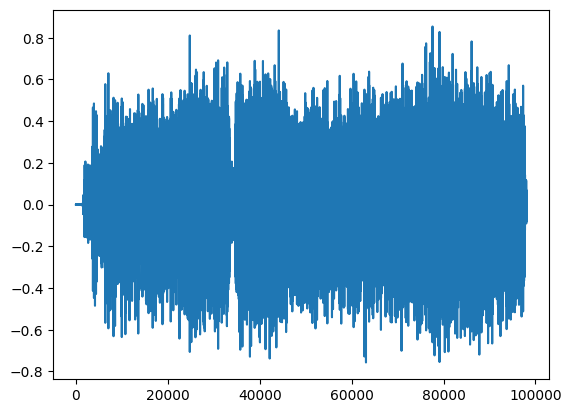

In [204]:
plt.plot(time, x, label="Waveform")

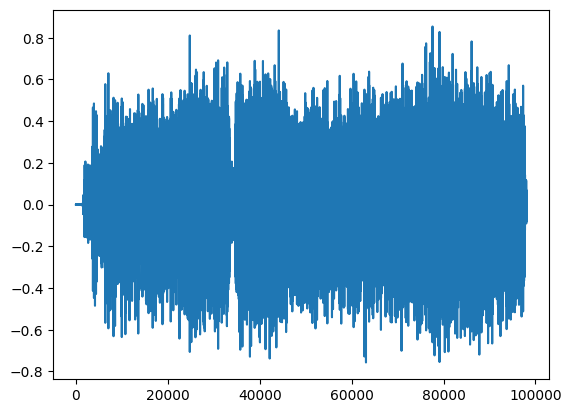

In [205]:
plt.plot(time2, x2, label="Waveform")

In [206]:
durationOfSample = 1/sr
durationOfSample*1e06 #in ms

122.0703125

In [207]:
K = 256 #num of samples per frame

In [208]:
soundDurationPerFrame = durationOfSample*K
soundDurationPerFrame

0.03125

In [210]:
fft_result = np.fft.fft(x2)
freqs = np.fft.fftfreq(len(fft_result), 1/sr2)
magnitude = np.abs(fft_result)

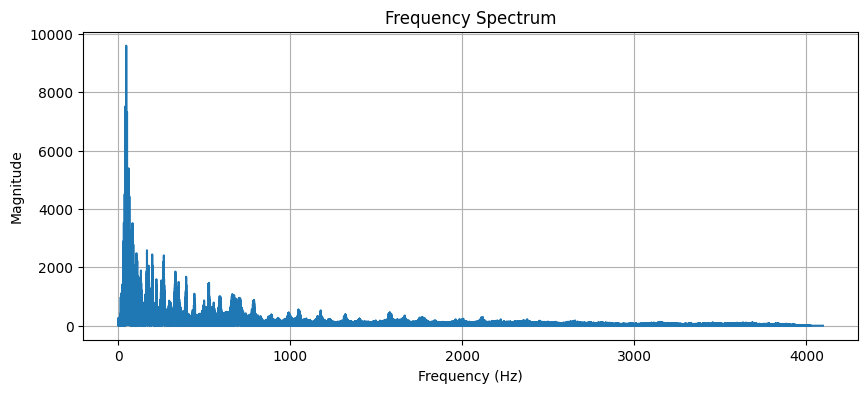

In [211]:
# Plot the frequency spectrum
plt.figure(figsize=(10, 4))
plt.plot(freqs[:len(freqs)//2], magnitude[:len(magnitude)//2])  # Only plot positive frequencies
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
plt.title("Frequency Spectrum")
plt.grid()
plt.show()

In [212]:
freqs

array([ 0.        ,  0.00521779,  0.01043559, ..., -0.01565338,
       -0.01043559, -0.00521779])

In [213]:
fft_result

array([175.80041264+5.68434189e-14j,  -2.4318106 +1.67676494e+01j,
       -32.73877903-2.22568814e+01j, ...,   6.87133961-7.31250845e+00j,
       -32.73877903+2.22568814e+01j,  -2.4318106 -1.67676494e+01j])

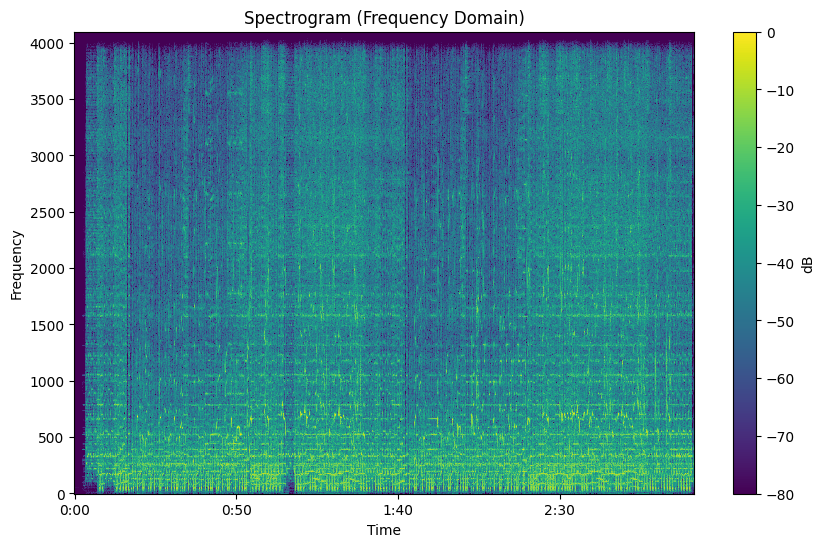

In [214]:
stft_result = librosa.stft(x)  # Returns a complex-valued matrix

# Convert the complex STFT result to magnitude (absolute values)
magnitude = np.abs(stft_result)

# Optionally, convert to dB scale for better visualization
magnitude_db = librosa.amplitude_to_db(magnitude, ref=np.max)

# Plot the spectrogram
plt.figure(figsize=(10, 6))
librosa.display.specshow(magnitude_db, sr=sr, x_axis='time', y_axis='hz', cmap='viridis')
plt.colorbar(label='dB')
plt.title("Spectrogram (Frequency Domain)")
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.show()

In [215]:
print(stft_result)

[[ 4.66896803e-04+0.0000000e+00j  1.25594798e-03+0.0000000e+00j
   1.52718253e-03+0.0000000e+00j ...  4.09164047e-03+0.0000000e+00j
   3.36402804e-02+0.0000000e+00j  2.67948341e-02+0.0000000e+00j]
 [-3.18437087e-04-6.4175249e-05j -2.64207309e-04+8.4147585e-04j
  -1.69194280e-03-5.6372781e-04j ... -6.80680480e-03+1.8771905e-02j
  -2.15501469e-02+1.0732126e-02j -1.84160136e-02-1.7402017e-02j]
 [ 4.55605390e-04+3.9840961e-04j -6.31283561e-04-6.4659317e-04j
   1.47063099e-03+1.9552822e-04j ...  1.35350320e-02-2.0497809e-03j
  -3.76869319e-03-1.5321021e-02j  3.16849141e-03+2.2363450e-02j]
 ...
 [-1.10624029e-07-2.5352958e-07j  1.21105373e-07+1.2576501e-07j
  -5.33828592e-10-1.4224308e-09j ...  1.93263801e-07-5.2199036e-09j
  -4.33764853e-07-4.8065296e-08j  3.35515367e-08-6.2019488e-08j]
 [ 1.04017815e-07+1.2721833e-07j  6.54696635e-08-1.1641955e-07j
  -1.68309408e-10+6.6518796e-10j ... -2.21718295e-07-2.2794366e-07j
  -3.26964766e-07+6.8695208e-08j -2.98889224e-09+1.0474928e-08j]
 [-1.05082

In [216]:
magnitude_db

array([[-80.      , -80.      , -80.      , ..., -80.      , -69.59543 ,
        -71.5716  ],
       [-80.      , -80.      , -80.      , ..., -74.12598 , -72.501434,
        -72.0574  ],
       [-80.      , -80.      , -80.      , ..., -77.40495 , -76.17173 ,
        -73.05553 ],
       ...,
       [-80.      , -80.      , -80.      , ..., -80.      , -80.      ,
        -80.      ],
       [-80.      , -80.      , -80.      , ..., -80.      , -80.      ,
        -80.      ],
       [-80.      , -80.      , -80.      , ..., -80.      , -80.      ,
        -80.      ]], dtype=float32)

In [217]:
ipd.Audio(x, rate=sr)

In [218]:
sample_duration = 1/sr
print(f"Sample duration is {sample_duration:6f} sec")

Sample duration is 0.000122 sec


In [219]:
total_duration = len(x) * sample_duration
print(f"Total duration is {total_duration} sec")

Total duration is 191.65185546875 sec


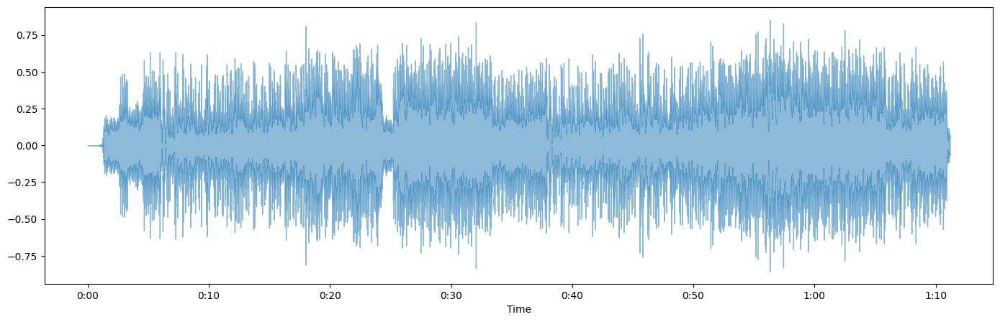

In [220]:
plt.figure(figsize=(17,5))
librosa.display.waveshow(x, alpha=0.5)

In [265]:
frame_size = 1024
hop_length = 768

In [266]:
def get_amplitude_envelop(signal, frame_size, hop_length):
    amplitude_envelop = []
    for i in range(0,len(signal),hop_length):
        amplitude_envelop.append(max(signal[i:i+frame_size]))

    return np.array(amplitude_envelop)

In [267]:
amplitude_envelop = get_amplitude_envelop(x, frame_size, hop_length)

In [268]:
len(amplitude_envelop)

2045

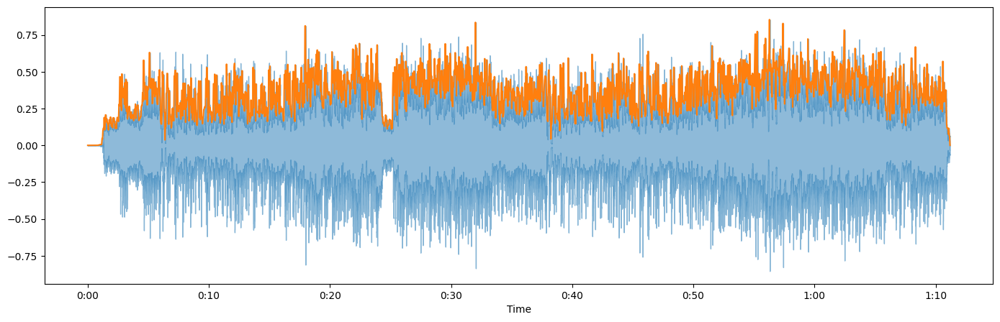

In [270]:
frames = range(0, amplitude_envelop.size)
time = librosa.frames_to_time(frames,hop_length=hop_length)
plt.figure(figsize=(17,5))
librosa.display.waveshow(x, alpha=0.5)
plt.plot(time, amplitude_envelop)

In [248]:
len(time),len(amplitude_envelop)

(2045, 2045)

In [249]:
y, sr = librosa.load('Dataset2/mixture.wav', sr=8192)

In [250]:
(hop_length/sampling_rate)*128

12.0

In [251]:
(768/8192)*128

12.0

In [311]:
x_fft = sp.fft.fft(x)
mag = np.abs(x_fft)
freq = np.linspace(0, sampling_rate, len(mag))

In [312]:
freq.shape

(1570012,)

Text(0, 0.5, 'mag')

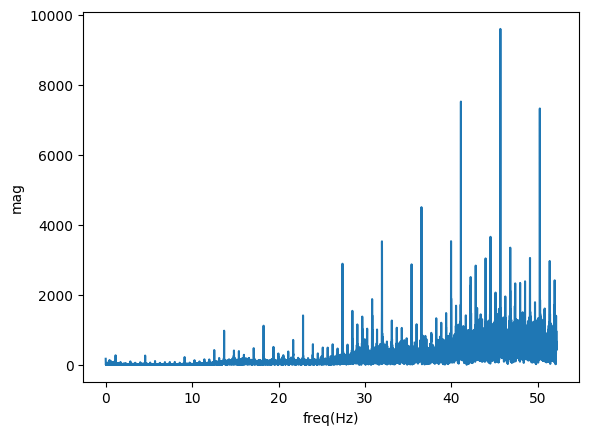

In [325]:
plt.plot(freq[:10000], mag[0:10000])
plt.xlabel("freq(Hz)")
plt.ylabel("mag")

In [327]:
d = 1/sampling_rate
d

0.0001220703125

In [424]:
d_fundamental = 1/
d_fundamental

1

In [356]:
len(x)

1570012

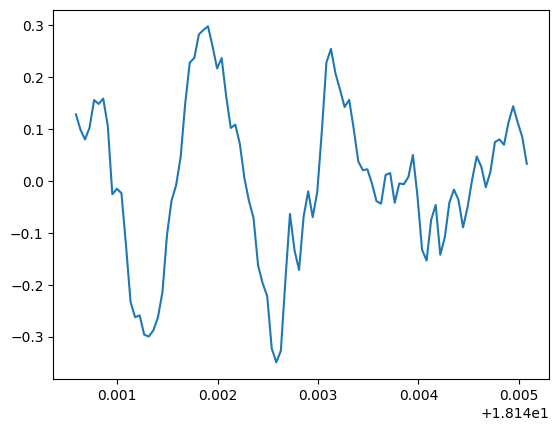

In [417]:
samples = range(len(x))
t = librosa.samples_to_time(samples)
plt.plot(t[400000:400100], x[400000:400100])

In [444]:
phase = 0
phase2 = 0.1
sine  = 0.5 * np.sin(2*np.pi*(sampling_rate*t-phase))
sine2  = 0.5 * np.sin(2*np.pi*(d_fundamental*t-phase2))

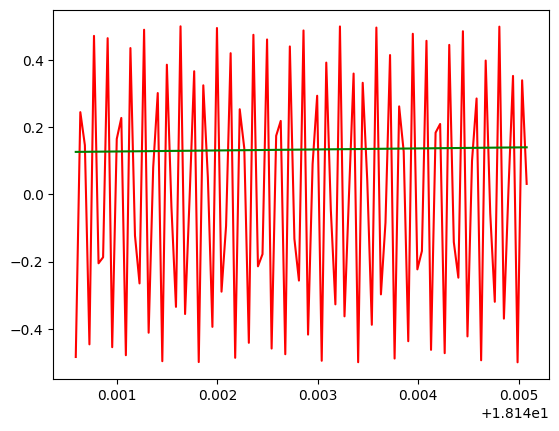

In [445]:
plt.plot(t[400000:400100], sine[400000:400100], color = 'r')
plt.plot(t[400000:400100], sine2[400000:400100], color= 'g')

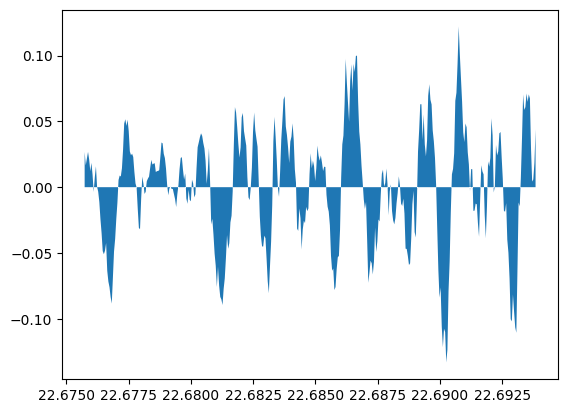

In [409]:
plt.fill_between(t[500000:500400], x[500000:500400]*sine[500000:500400])

In [491]:
X_train,sampling_rate = librosa.load(filename_mixmusic+'/023 - Jokers, Jacks & Kings - Sea Of Leaves/mixture.wav', sr=sampling_rate)

In [517]:
frame_size = 1022
hop_length = 768
X_stft = librosa.stft(X_train,n_fft=frame_size, hop_length=hop_length)
X_magnitude = np.abs(X_stft)
X_db = librosa.amplitude_to_db(X_magnitude)
X_train.shape

(1570012,)

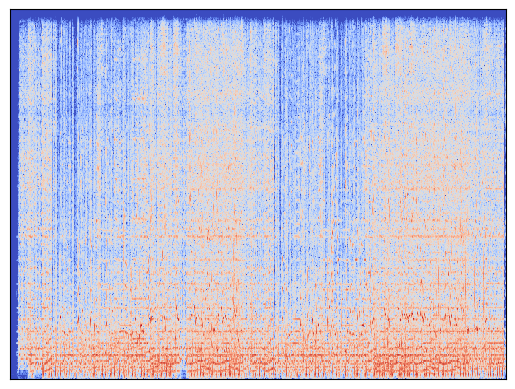

In [518]:
librosa.display.specshow(X_db)

In [519]:
phase = np.angle(X_stft)
complex_spectrogram = X_magnitude * np.exp(1j * phase)
reconstructed_signal = librosa.istft(complex_spectrogram, hop_length=hop_length, win_length=frame_size)

In [521]:
reconstructed_signal.shape

(1569792,)

In [522]:
sf.write('reconstructed_audio.wav', reconstructed_signal, sampling_rate)

In [523]:
X_magnitude.shape

(512, 2045)

## We apply the mask on magnitude and leave the phase as it is and reconstruct the original signal

In [533]:
patches = extract_patches(X_magnitude, 128)

In [534]:
new_mag = patches.reshape(512, -1)

In [542]:
new_complex_spectrogram = new_mag * np.exp(1j * phase[:,:new_mag.shape[1]])
new_reconstructed_signal = librosa.istft(complex_spectrogram, hop_length=hop_length, win_length=frame_size)
sf.write('new_reconstructed_audio.wav', new_reconstructed_signal, sampling_rate)

In [536]:
patches.shape

(512, 128, 15)

In [537]:
X_magnitude.shape

(512, 2045)

In [551]:
def reconstruct_signal_from_patches(patches, phase,freq_bin, hop_length, frame_size):
    mag = patches.reshape(freq_bin, -1)
    complex_spectrogram = mag * np.exp(1j * phase[:,:mag.shape[1]])
    reconstructed_signal = librosa.istft(complex_spectrogram, hop_length=hop_length, win_length=frame_size)
    return reconstructed_signal
    # sf.write('new_reconstructed_audio.wav', new_reconstructed_signal, sampling_rate)
        

In [552]:
re_const = reconstruct_signal_from_patches(patches, phase, freq_bin, hop_length, frame_size)
ipd.Audio(re_const, rate=sampling_rate)